In [1]:
!pip install ultralytics
# Importing the required libraries
from ultralytics import YOLO
import squarify
import matplotlib.pyplot as plt
import cv2
import os
import random
import pandas as pd
import matplotlib.image as mpimg
import seaborn as sns
import yaml
import matplotlib.patches as patches
import torchvision.transforms as transforms

sns.set_style('darkgrid')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.4/40.4 kB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 716.2/716.2 kB 17.5 MB/s eta 0:00:00


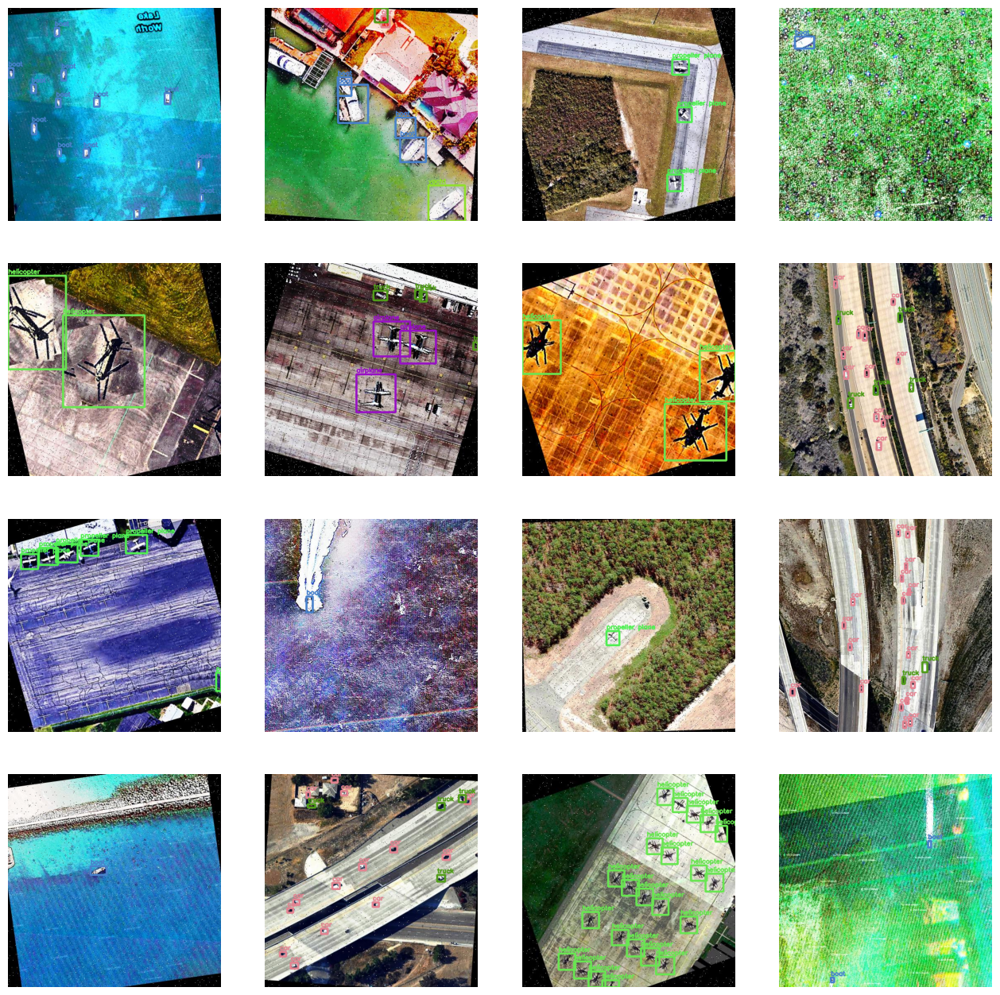

In [2]:
# Define the paths to the images and labels directories
train_images = "/kaggle/input/sat-augmented/train/images"
train_labels = "/kaggle/input/sat-augmented/train/labels"

test_images = "/kaggle/input/sat-augmented/test/images"
test_labels = "/kaggle/input/sat-augmented/labels"

val_images = "/kaggle/input/sat-augmented/images"
val_labels = "/kaggle/input/sat-augmented/labels"

# Load class information from the YAML file
yaml_path = "/kaggle/input/sat-augmented/data.yaml"
with open(yaml_path, "r") as f:
    data = yaml.load(f, Loader=yaml.FullLoader)
classes = data["names"]

# Get a list of all the image files in the training images directory
image_files = os.listdir(train_images)

# Choose 16 random image files from the list
random_images = random.sample(image_files, 16)

# Set up the plot
fig, axs = plt.subplots(4, 4, figsize=(16, 16))

# Function to generate a random color
def random_color():
    return tuple(random.randint(0, 255) for _ in range(3))

# Assign different colors to each class
class_colors = {class_name: random_color() for class_name in classes}

# Loop over the random images and plot the object detections
for i, image_file in enumerate(random_images):
    row = i // 4
    col = i % 4
    
    # Load the image
    image_path = os.path.join(train_images, image_file)
    image = cv2.imread(image_path)

    # Load the labels for this image
    label_file = os.path.splitext(image_file)[0] + ".txt"
    label_path = os.path.join(train_labels, label_file)
    with open(label_path, "r") as f:
        labels = f.read().strip().split("\n")

    # Loop over the labels and plot the object detections
    for label in labels:
        if len(label.split()) != 5:
            continue
        class_id, x_center, y_center, width, height = map(float, label.split())
        x_min = int((x_center - width/2) * image.shape[1])
        y_min = int((y_center - height/2) * image.shape[0])
        x_max = int((x_center + width/2) * image.shape[1])
        y_max = int((y_center + height/2) * image.shape[0])
        
        # Use the color assigned to the class
        color = class_colors[classes[int(class_id)]]
        
        # Draw the rectangle with the assigned color
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), color, 3)
        
        # Add class label to the rectangle
        class_name = classes[int(class_id)]
        cv2.putText(image, class_name, (x_min, y_min - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    # Show the image with the object detections
    axs[row, col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axs[row, col].axis('off')

plt.show()


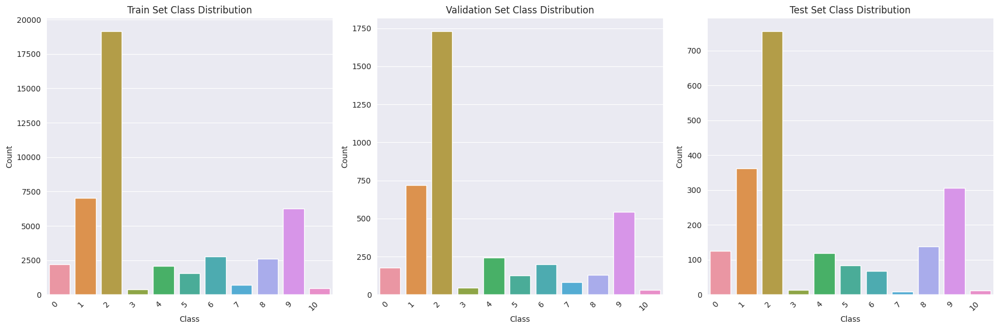

In [3]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from collections import Counter

def parse_yolov8_annotations(annotation_path):
    annotations = []
    with open(annotation_path, 'r') as file:
        for line in file:
            line = line.strip().split()
            class_label = int(line[0])
            annotations.append(class_label)
    return annotations

# Replace these paths with your actual paths
train_path = "/kaggle/input/sat-augmented/train/labels/"
valid_path = "/kaggle/input/sat-augmented/valid/labels/"
test_path = "/kaggle/input/sat-augmented/test/labels/"

# Load annotations for train, validation, and test sets
train_annotations = []
valid_annotations = []
test_annotations = []

for file_name in os.listdir(train_path):
    train_annotations.extend(parse_yolov8_annotations(os.path.join(train_path, file_name)))

for file_name in os.listdir(valid_path):
    valid_annotations.extend(parse_yolov8_annotations(os.path.join(valid_path, file_name)))

for file_name in os.listdir(test_path):
    test_annotations.extend(parse_yolov8_annotations(os.path.join(test_path, file_name)))

# Convert to Pandas DataFrame
train_df = pd.DataFrame({'class': train_annotations})
valid_df = pd.DataFrame({'class': valid_annotations})
test_df = pd.DataFrame({'class': test_annotations})

# Plot class distribution for train set
plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
sns.countplot(x='class', data=train_df)
plt.title('Train Set Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability

# Plot class distribution for validation set
plt.subplot(1, 3, 2)
sns.countplot(x='class', data=valid_df)
plt.title('Validation Set Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability

# Plot class distribution for test set
plt.subplot(1, 3, 3)
sns.countplot(x='class', data=test_df)
plt.title('Test Set Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability

plt.tight_layout()
plt.show()


In [4]:
# import yaml

# # Define the data dictionary
# data_dict = {
#     'train': ['/kaggle/input/satyolo8/train/images', '/kaggle/input/satyolo8/train/images'],  # Duplicate the training set
#     'val': ['/kaggle/input/satyolo8/valid/images','/kaggle/input/satyolo8/valid/images'],
#     'test': ['/kaggle/input/satyolo8/test/images','/kaggle/input/satyolo8/test/images'],
#     'nc': 11,
#     'names': ['airplane', 'boat', 'car', 'cargo ship', 'fighter jet', 'helicopter', 'jet', 'military aircraft', 'propeller plane', 'truck', 'yacht'],
#     'augmentation': {
#         'degrees': 30.0,  # rotation
#         'translate': 0.3,  # translation
#         'scale': 0.5,  # scale
#         'shear': 5.0  # shear
#     }
# }

# # Save the data dictionary to a YAML file
# with open('/kaggle/working/data.yaml', 'w') as yaml_file:
#     yaml.dump(data_dict, yaml_file, default_flow_style=False)


In [5]:
import yaml

# Define the data dictionary
data_dict = {
    'train': ['/kaggle/input/sat-augmented/train/images'],  # Duplicate the training set
    'val': ['/kaggle/input/sat-augmented/valid/images'],
    'test': ['/kaggle/input/sat-augmented/test/images'],
    'nc': 11,
    'names': ['airplane', 'boat', 'car', 'cargo ship', 'fighter jet', 'helicopter', 'jet', 'military aircraft', 'propeller plane', 'truck', 'yacht'],
    'augmentation': {
        'degrees': 30.0,  # rotation
        'translate': 0.3,  # translation
        'scale': 0.5,  # scale
        'shear': 5.0  # shear
    }
}

# Save the data dictionary to a YAML file
with open('/kaggle/working/data.yaml', 'w') as yaml_file:
    yaml.dump(data_dict, yaml_file, default_flow_style=False)


In [6]:
#disable wandb
import os
os.environ["WANDB_DISABLED"] = "true"

In [7]:
# Loading a pretrained model
model = YOLO('yolov8x.pt')

# Training the model with data augmentation
model.train(data='/kaggle/working/data.yaml',
            epochs=100,
            imgsz=512,
            seed=42,
            batch=8,
            workers=4,
            project='yolo8',
            name='result')


100%|██████████| 131M/131M [00:00<00:00, 286MB/s]


Ultralytics YOLOv8.1.19 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8x.pt, data=/kaggle/working/data.yaml, epochs=100, time=None, patience=100, batch=8, imgsz=512, save=True, save_period=-1, cache=False, device=None, workers=4, project=yolo8, name=result, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxe

100%|██████████| 755k/755k [00:00<00:00, 22.2MB/s]
2024-02-27 02:49:33,204	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-02-27 02:49:34,071	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-02-27 02:49:36.779882: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-27 02:49:36.779980: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-27 02:49:36.947930: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS facto

Overriding model.yaml nc=80 with nc=11

                   from  n    params  module                                       arguments                     
  0                  -1  1      2320  ultralytics.nn.modules.conv.Conv             [3, 80, 3, 2]                 
  1                  -1  1    115520  ultralytics.nn.modules.conv.Conv             [80, 160, 3, 2]               
  2                  -1  3    436800  ultralytics.nn.modules.block.C2f             [160, 160, 3, True]           
  3                  -1  1    461440  ultralytics.nn.modules.conv.Conv             [160, 320, 3, 2]              
  4                  -1  6   3281920  ultralytics.nn.modules.block.C2f             [320, 320, 6, True]           
  5                  -1  1   1844480  ultralytics.nn.modules.conv.Conv             [320, 640, 3, 2]              
  6                  -1  6  13117440  ultralytics.nn.modules.block.C2f             [640, 640, 6, True]           
  7                  -1  1   3687680  ultralytic

wandb: Tracking run with wandb version 0.16.2
wandb: W&B syncing is set to `offline` in this directory.  
wandb: Run `wandb online` or set WANDB_MODE=online to enable cloud syncing.


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...


100%|██████████| 6.23M/6.23M [00:00<00:00, 131MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/sat-augmented/train/labels... 4414 images, 3 backgrounds, 0 corrupt: 100%|██████████| 4414/4414 [00:09<00:00, 464.13it/s]


train: WARNING ⚠️ Cache directory /kaggle/input/sat-augmented/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/input/sat-augmented/valid/labels... 420 images, 2 backgrounds, 0 corrupt: 100%|██████████| 420/420 [00:01<00:00, 411.92it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/sat-augmented/valid is not writeable, cache not saved.


Plotting labels to yolo8/result/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000667, momentum=0.9) with parameter groups 97 weight(decay=0.0), 104 weight(decay=0.0005), 103 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 2 dataloader workers
Logging results to yolo8/result
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      5.18G      1.664      1.869      1.231         62        512: 100%|██████████| 552/552 [03:53<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:10<00:00,  2.57it/s]

                   all        420       4024      0.442      0.476      0.459      0.268



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      5.54G      1.638      1.545      1.246        179        512: 100%|██████████| 552/552 [03:47<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.96it/s]

                   all        420       4024      0.625      0.461      0.506      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      5.57G      1.635       1.48      1.242         66        512: 100%|██████████| 552/552 [03:45<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.94it/s]

                   all        420       4024      0.627      0.505      0.581      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      5.53G      1.575      1.379       1.21         68        512: 100%|██████████| 552/552 [03:44<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.94it/s]

                   all        420       4024      0.674      0.593      0.642      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      5.57G      1.511      1.269      1.181         49        512: 100%|██████████| 552/552 [03:45<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.96it/s]

                   all        420       4024      0.613      0.603      0.642      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100       5.6G      1.472      1.204       1.16         97        512: 100%|██████████| 552/552 [03:44<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.98it/s]

                   all        420       4024      0.665      0.641      0.696       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      5.64G      1.447      1.153      1.155         30        512: 100%|██████████| 552/552 [03:45<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.96it/s]

                   all        420       4024      0.689      0.673      0.721      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      5.64G      1.396      1.088      1.123        146        512: 100%|██████████| 552/552 [03:45<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.97it/s]

                   all        420       4024       0.67      0.683      0.704      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      5.53G      1.358      1.046      1.112        176        512: 100%|██████████| 552/552 [03:44<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.97it/s]

                   all        420       4024      0.726      0.706      0.758      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      5.59G      1.333       1.01      1.102         41        512: 100%|██████████| 552/552 [03:44<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.96it/s]

                   all        420       4024      0.676      0.715      0.751      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      5.53G      1.316     0.9975      1.088         55        512: 100%|██████████| 552/552 [03:44<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.97it/s]

                   all        420       4024      0.686      0.761      0.758      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      5.59G      1.302     0.9575      1.086         84        512: 100%|██████████| 552/552 [03:44<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.96it/s]

                   all        420       4024      0.717      0.724      0.771      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      5.58G      1.272     0.9286      1.068        139        512: 100%|██████████| 552/552 [03:44<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.96it/s]

                   all        420       4024      0.733      0.763      0.787      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      5.54G      1.251      0.909      1.064         74        512: 100%|██████████| 552/552 [03:45<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.97it/s]

                   all        420       4024      0.731      0.743      0.774       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      5.56G      1.248     0.9078       1.06         84        512: 100%|██████████| 552/552 [03:44<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.98it/s]

                   all        420       4024      0.751      0.727      0.784      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      5.57G      1.224     0.8758      1.055         80        512: 100%|██████████| 552/552 [03:44<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.99it/s]

                   all        420       4024      0.761      0.769      0.808      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      5.53G      1.216     0.8598      1.046         77        512: 100%|██████████| 552/552 [03:44<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.98it/s]

                   all        420       4024      0.733      0.759      0.789      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      5.57G      1.207      0.852      1.036         35        512: 100%|██████████| 552/552 [03:44<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.99it/s]

                   all        420       4024      0.803      0.743      0.827      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      5.55G      1.191     0.8227      1.036         62        512: 100%|██████████| 552/552 [03:44<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.97it/s]

                   all        420       4024      0.756       0.79       0.81      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      5.58G      1.182     0.8097      1.031         66        512: 100%|██████████| 552/552 [03:44<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.98it/s]

                   all        420       4024      0.784      0.798      0.826      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      5.64G      1.174     0.8206      1.028        102        512: 100%|██████████| 552/552 [03:45<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.98it/s]

                   all        420       4024      0.804      0.758      0.829      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      5.53G      1.159     0.8113      1.022        134        512: 100%|██████████| 552/552 [03:44<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.99it/s]

                   all        420       4024      0.777      0.787      0.813      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      5.56G      1.152     0.7861      1.019        112        512: 100%|██████████| 552/552 [03:44<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.97it/s]

                   all        420       4024       0.79      0.785      0.815      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      5.53G      1.152     0.7832      1.023         48        512: 100%|██████████| 552/552 [03:44<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.97it/s]

                   all        420       4024      0.799      0.784      0.832       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      5.64G      1.129     0.7653      1.004         74        512: 100%|██████████| 552/552 [03:45<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.98it/s]

                   all        420       4024      0.788       0.78      0.822      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      5.56G      1.125     0.7531      1.005         53        512: 100%|██████████| 552/552 [03:44<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.99it/s]

                   all        420       4024       0.79      0.804      0.835      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      5.62G      1.121     0.7534      1.005         51        512: 100%|██████████| 552/552 [03:44<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.97it/s]

                   all        420       4024      0.809      0.797      0.837      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      5.54G       1.11     0.7424      1.002         40        512: 100%|██████████| 552/552 [03:45<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.99it/s]

                   all        420       4024      0.795      0.774      0.819      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      5.56G      1.099     0.7248     0.9991         35        512: 100%|██████████| 552/552 [03:44<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.97it/s]

                   all        420       4024      0.797      0.768       0.83      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      5.54G       1.09     0.7157     0.9925         47        512: 100%|██████████| 552/552 [03:44<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.98it/s]

                   all        420       4024      0.799      0.794      0.838      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      5.53G      1.096     0.7259     0.9949         47        512: 100%|██████████| 552/552 [03:45<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.99it/s]

                   all        420       4024      0.823      0.799      0.852      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      5.53G      1.071     0.6982     0.9847         59        512: 100%|██████████| 552/552 [03:45<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.99it/s]

                   all        420       4024      0.783      0.814      0.849      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      5.57G      1.073     0.6937     0.9841         70        512: 100%|██████████| 552/552 [03:44<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.98it/s]

                   all        420       4024      0.844      0.786      0.855      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      5.53G      1.082     0.6985     0.9852         77        512: 100%|██████████| 552/552 [03:45<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.97it/s]

                   all        420       4024      0.846      0.806       0.86      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100       5.6G      1.073     0.6857     0.9847         61        512: 100%|██████████| 552/552 [03:44<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.98it/s]

                   all        420       4024      0.812      0.827      0.857       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      5.69G      1.056     0.6843     0.9779         76        512: 100%|██████████| 552/552 [03:44<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.99it/s]

                   all        420       4024      0.811      0.797      0.854      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      5.56G       1.05     0.6718     0.9782         65        512: 100%|██████████| 552/552 [03:44<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.99it/s]

                   all        420       4024      0.828      0.808      0.859      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      5.58G      1.048      0.676      0.977         84        512: 100%|██████████| 552/552 [03:44<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.97it/s]

                   all        420       4024      0.787      0.843       0.86      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      5.61G       1.05     0.6639     0.9701        110        512: 100%|██████████| 552/552 [03:45<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.98it/s]

                   all        420       4024      0.785      0.827      0.847      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      5.56G      1.037     0.6589     0.9683         96        512: 100%|██████████| 552/552 [03:45<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.97it/s]

                   all        420       4024      0.829      0.798       0.86      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      5.57G      1.025     0.6523     0.9681         31        512: 100%|██████████| 552/552 [03:45<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.98it/s]

                   all        420       4024      0.826      0.837      0.871      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      5.55G      1.026      0.645     0.9619        134        512: 100%|██████████| 552/552 [03:44<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.98it/s]

                   all        420       4024      0.801      0.822      0.845      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      5.63G      1.019     0.6339     0.9636         92        512: 100%|██████████| 552/552 [03:44<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  3.00it/s]

                   all        420       4024      0.829      0.809      0.862      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      5.54G      1.012      0.631     0.9636        121        512: 100%|██████████| 552/552 [03:44<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.97it/s]

                   all        420       4024      0.814      0.833      0.861      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      5.52G      1.009     0.6304     0.9581         66        512: 100%|██████████| 552/552 [03:44<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.99it/s]

                   all        420       4024      0.807       0.82      0.845      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      5.53G      1.003     0.6145     0.9595        114        512: 100%|██████████| 552/552 [03:44<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.99it/s]

                   all        420       4024       0.83      0.831       0.87       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      5.51G      1.002     0.6119     0.9532         44        512: 100%|██████████| 552/552 [03:45<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.98it/s]

                   all        420       4024      0.827      0.823      0.864      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      5.56G     0.9851     0.6051     0.9517         58        512: 100%|██████████| 552/552 [03:44<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.97it/s]

                   all        420       4024      0.808       0.83      0.862      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      5.54G     0.9923     0.6065     0.9505         87        512: 100%|██████████| 552/552 [03:45<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.97it/s]

                   all        420       4024      0.811      0.829      0.867      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      5.58G     0.9879     0.6014     0.9538         54        512: 100%|██████████| 552/552 [03:44<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.98it/s]

                   all        420       4024      0.841      0.819      0.872       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      5.58G     0.9751     0.5928     0.9453         37        512: 100%|██████████| 552/552 [03:45<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.96it/s]

                   all        420       4024      0.849       0.81      0.868      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      5.55G     0.9734     0.5856      0.945         51        512: 100%|██████████| 552/552 [03:45<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.98it/s]

                   all        420       4024       0.84       0.83      0.869      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      5.54G     0.9683      0.582     0.9416         78        512: 100%|██████████| 552/552 [03:45<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.98it/s]

                   all        420       4024      0.834      0.823      0.856      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      5.53G     0.9726     0.5835     0.9449        123        512: 100%|██████████| 552/552 [03:45<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.98it/s]

                   all        420       4024      0.847      0.825      0.855      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      5.53G     0.9655     0.5734     0.9416        101        512: 100%|██████████| 552/552 [03:45<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.98it/s]

                   all        420       4024      0.819      0.832      0.868      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      5.55G     0.9511     0.5662     0.9373         55        512: 100%|██████████| 552/552 [03:45<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.99it/s]

                   all        420       4024      0.831      0.825      0.861      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      5.55G     0.9529     0.5622     0.9422         60        512: 100%|██████████| 552/552 [03:45<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.97it/s]

                   all        420       4024      0.839      0.827      0.876      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      5.56G     0.9477     0.5562     0.9394         69        512: 100%|██████████| 552/552 [03:45<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.97it/s]

                   all        420       4024      0.842      0.847      0.887      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      5.64G     0.9355     0.5533     0.9355         79        512: 100%|██████████| 552/552 [03:45<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.96it/s]

                   all        420       4024       0.85      0.834      0.877      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      5.53G     0.9402     0.5472     0.9354        103        512: 100%|██████████| 552/552 [03:45<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  3.00it/s]

                   all        420       4024       0.87      0.824      0.883      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      5.57G     0.9458     0.5606     0.9363         23        512: 100%|██████████| 552/552 [03:45<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.91it/s]

                   all        420       4024      0.836      0.837      0.874      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      5.53G     0.9288     0.5422     0.9292         99        512: 100%|██████████| 552/552 [03:44<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.99it/s]

                   all        420       4024      0.837      0.835      0.873      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      5.54G     0.9277     0.5415     0.9305        148        512: 100%|██████████| 552/552 [03:45<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.97it/s]

                   all        420       4024      0.851       0.83      0.875      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      5.53G     0.9223     0.5311     0.9283         57        512: 100%|██████████| 552/552 [03:44<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.98it/s]

                   all        420       4024      0.854      0.833      0.876      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      5.58G      0.922     0.5272     0.9259        157        512: 100%|██████████| 552/552 [03:44<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.96it/s]

                   all        420       4024      0.851      0.823      0.872      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      5.55G     0.9185     0.5246     0.9248         57        512: 100%|██████████| 552/552 [03:44<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.99it/s]

                   all        420       4024      0.848      0.819      0.869      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      5.56G     0.9112     0.5248     0.9233         42        512: 100%|██████████| 552/552 [03:45<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.96it/s]

                   all        420       4024       0.86      0.827       0.87       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      5.56G     0.9078     0.5185     0.9252         96        512: 100%|██████████| 552/552 [03:45<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.99it/s]

                   all        420       4024      0.823      0.844      0.871      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      5.58G     0.9043     0.5179     0.9239        116        512: 100%|██████████| 552/552 [03:44<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.98it/s]

                   all        420       4024      0.836      0.839      0.864      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      5.55G     0.8978     0.5101     0.9169        116        512: 100%|██████████| 552/552 [03:44<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.97it/s]

                   all        420       4024       0.86      0.829      0.881      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      5.56G     0.8915     0.5022     0.9206         24        512: 100%|██████████| 552/552 [03:45<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.96it/s]

                   all        420       4024      0.849      0.826      0.879      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      5.53G      0.889     0.5038     0.9203         56        512: 100%|██████████| 552/552 [03:45<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.96it/s]

                   all        420       4024      0.873      0.822      0.887      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      5.53G     0.8851     0.4996     0.9183         46        512: 100%|██████████| 552/552 [03:44<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.97it/s]

                   all        420       4024      0.846      0.847      0.885       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      5.55G     0.8905     0.5001      0.914         99        512: 100%|██████████| 552/552 [03:44<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.98it/s]

                   all        420       4024       0.86       0.84      0.878      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      5.53G     0.8751     0.4903     0.9118         78        512: 100%|██████████| 552/552 [03:44<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.99it/s]

                   all        420       4024      0.859       0.84      0.879      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      5.56G     0.8719     0.4861     0.9136        134        512: 100%|██████████| 552/552 [03:44<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.97it/s]

                   all        420       4024      0.837      0.866      0.883      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      5.55G     0.8686     0.4793     0.9119         71        512: 100%|██████████| 552/552 [03:44<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.99it/s]

                   all        420       4024      0.842      0.851      0.883      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      5.52G     0.8608     0.4777     0.9114         53        512: 100%|██████████| 552/552 [03:44<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.97it/s]

                   all        420       4024      0.864      0.837      0.885      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      5.57G     0.8605     0.4752      0.909         97        512: 100%|██████████| 552/552 [03:44<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.96it/s]

                   all        420       4024       0.86      0.828      0.886       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      5.58G       0.86     0.4768     0.9076         62        512: 100%|██████████| 552/552 [03:44<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.98it/s]

                   all        420       4024      0.829      0.864      0.868      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      5.56G     0.8545     0.4679     0.9063        100        512: 100%|██████████| 552/552 [03:44<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.98it/s]

                   all        420       4024      0.868      0.831      0.885      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      5.55G     0.8516     0.4654     0.9037         81        512: 100%|██████████| 552/552 [03:44<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:08<00:00,  3.01it/s]

                   all        420       4024      0.844      0.852      0.877      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      5.58G     0.8446     0.4577     0.9026         68        512: 100%|██████████| 552/552 [03:44<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.99it/s]

                   all        420       4024      0.873       0.84      0.884      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      5.56G     0.8405     0.4556     0.9043         96        512: 100%|██████████| 552/552 [03:44<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  3.00it/s]

                   all        420       4024      0.878      0.817      0.882      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      5.57G     0.8362     0.4542     0.9026         82        512: 100%|██████████| 552/552 [03:44<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.97it/s]

                   all        420       4024      0.851      0.839       0.88      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      5.54G     0.8339     0.4491     0.9034         37        512: 100%|██████████| 552/552 [03:44<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  3.00it/s]

                   all        420       4024      0.857      0.832      0.881      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      5.55G     0.8274      0.447     0.8988         69        512: 100%|██████████| 552/552 [03:44<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:08<00:00,  3.00it/s]

                   all        420       4024      0.846      0.854      0.879      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      5.63G     0.8228     0.4476     0.9008         71        512: 100%|██████████| 552/552 [03:44<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.99it/s]

                   all        420       4024      0.834      0.855      0.876      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      5.55G      0.819     0.4366     0.8963         42        512: 100%|██████████| 552/552 [03:44<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.99it/s]

                   all        420       4024      0.847      0.834      0.875      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100       5.5G     0.8191      0.442     0.8966         76        512: 100%|██████████| 552/552 [03:44<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  3.00it/s]

                   all        420       4024      0.836      0.843      0.877      0.678


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      5.53G     0.8422     0.4169     0.9093         43        512: 100%|██████████| 552/552 [03:44<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  3.00it/s]

                   all        420       4024      0.839      0.834      0.873      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      5.53G     0.8203     0.4066     0.9012         52        512: 100%|██████████| 552/552 [03:43<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.99it/s]

                   all        420       4024      0.873      0.812      0.876      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      5.53G     0.8109     0.3983     0.8951         78        512: 100%|██████████| 552/552 [03:43<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.99it/s]

                   all        420       4024       0.84       0.84      0.873      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      5.52G     0.8128     0.3997     0.8988         25        512: 100%|██████████| 552/552 [03:43<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.99it/s]

                   all        420       4024      0.837      0.844       0.87      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      5.53G     0.8016     0.3953     0.8922         88        512: 100%|██████████| 552/552 [03:43<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  3.00it/s]

                   all        420       4024      0.818      0.865      0.871      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      5.52G     0.7951     0.3891     0.8899        123        512: 100%|██████████| 552/552 [03:43<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.99it/s]

                   all        420       4024      0.814      0.868      0.875      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      5.51G     0.7837     0.3816     0.8853         19        512: 100%|██████████| 552/552 [03:43<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  3.00it/s]

                   all        420       4024      0.826       0.86      0.875       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      5.52G     0.7834     0.3849     0.8863         56        512: 100%|██████████| 552/552 [03:43<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.99it/s]

                   all        420       4024      0.835      0.865       0.88      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      5.53G     0.7825     0.3818     0.8829         52        512: 100%|██████████| 552/552 [03:43<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.99it/s]

                   all        420       4024      0.843      0.858      0.878      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      5.54G     0.7745     0.3773     0.8826         59        512: 100%|██████████| 552/552 [03:43<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:09<00:00,  2.98it/s]

                   all        420       4024       0.85      0.854      0.879      0.684



100 epochs completed in 6.615 hours.
Optimizer stripped from yolo8/result/weights/last.pt, 136.7MB
Optimizer stripped from yolo8/result/weights/best.pt, 136.7MB

Validating yolo8/result/weights/best.pt...
Ultralytics YOLOv8.1.19 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 268 layers, 68134161 parameters, 0 gradients, 257.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:17<00:00,  1.52it/s]


                   all        420       4024      0.858      0.829      0.886       0.69
              airplane        420        176       0.88      0.932      0.925      0.776
                  boat        420        719      0.927      0.905       0.95      0.696
                   car        420       1731      0.886      0.744      0.879       0.57
            cargo ship        420         46      0.838      0.739      0.864      0.713
           fighter jet        420        242      0.978      0.925      0.984      0.768
            helicopter        420        125      0.976       0.98      0.993      0.748
                   jet        420        198      0.895      0.924      0.938      0.792
     military aircraft        420         82      0.845      0.878      0.912      0.772
       propeller plane        420        129      0.868      0.915      0.911      0.694
                 truck        420        545      0.701      0.589      0.668      0.454
                 yach

wandb:                                                                                
wandb: 
wandb: Run history:
wandb:                  lr/pg0 ▃███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
wandb:                  lr/pg1 ▃███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
wandb:                  lr/pg2 ▃███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
wandb:        metrics/mAP50(B) ▁▃▅▅▆▆▇▇▇▇▇▇▇█▇▇█████▇██████████████████
wandb:     metrics/mAP50-95(B) ▁▂▄▄▅▆▆▆▇▆▇▆▇▇▇▇▇▇▇▇▇▇▇█████████████████
wandb:    metrics/precision(B) ▁▄▅▅▅▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇██▇█▇██▇██▇█▇█▇██▇▇█
wandb:       metrics/recall(B) ▁▂▄▅▆▆▆▆▆▇▇▆▇▇▇▇██▇▇▇▇▇███▇█▇██▇█▇██▇██▇
wandb:            model/GFLOPs ▁
wandb:        model/parameters ▁
wandb: model/speed_PyTorch(ms) ▁
wandb:          train/box_loss ██▆▆▅▅▅▄▄▄▄▄▄▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁
wandb:          train/cls_loss █▆▅▄▄▄▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
wandb:          train/dfl_loss ██▆▆▅▅▄▄▄▄▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁
wandb:            val/box_loss ██▆▅▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ef20779d390>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.

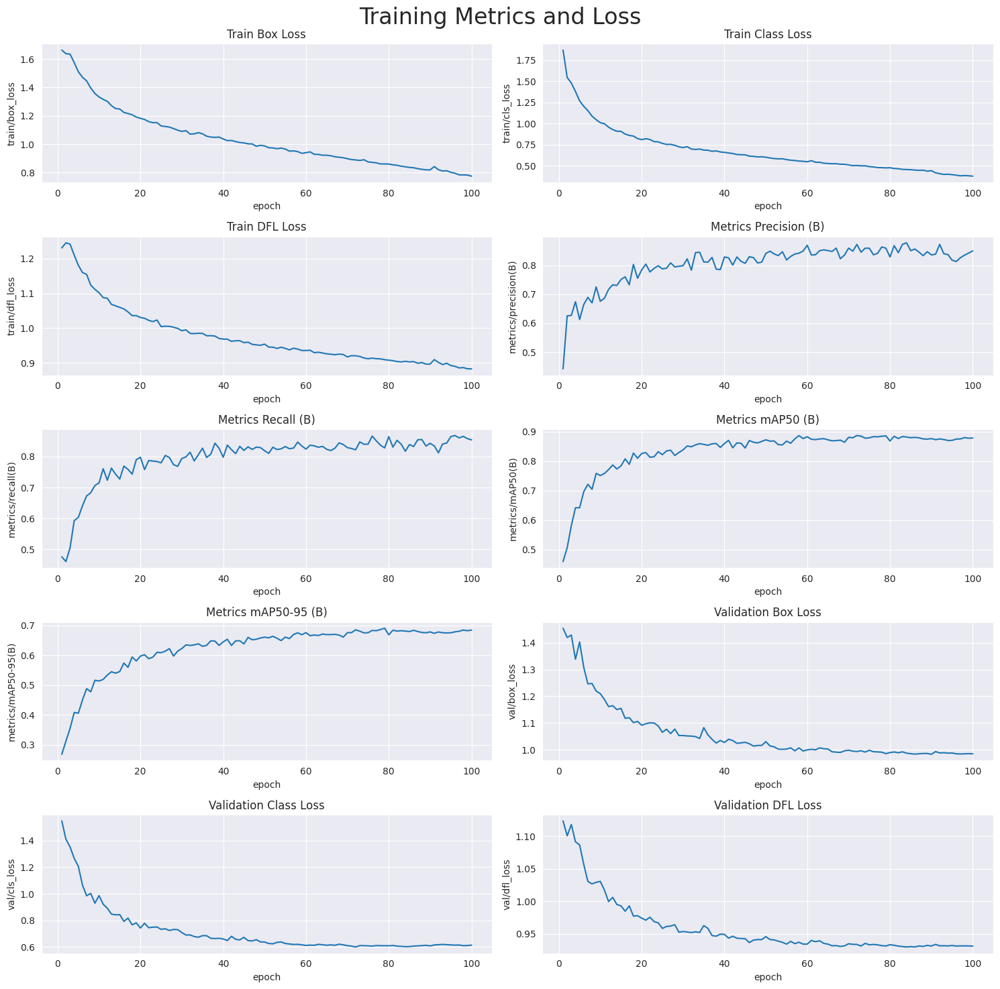

In [8]:
# read in the results.csv file as a pandas dataframe
df = pd.read_csv('/kaggle/working/yolo8/result/results.csv')
df.columns = df.columns.str.strip()

# create subplots using seaborn
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=df, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=df, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=df, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=df, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=df, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=df, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=df, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=df, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=df, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=df, ax=axs[4,1])

# set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')

# add suptitle and subheader
plt.suptitle('Training Metrics and Loss', fontsize=24)

# adjust top margin to make space for suptitle
plt.subplots_adjust(top=0.8)

# adjust spacing between subplots
plt.tight_layout()

plt.show()

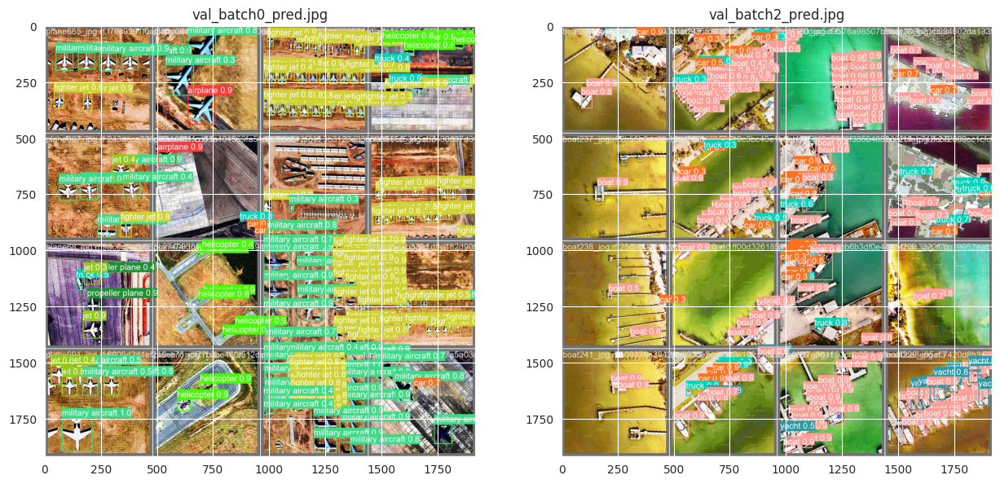

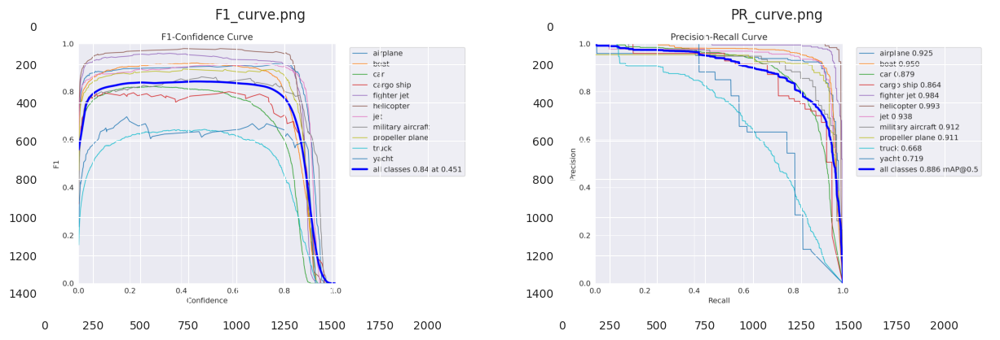

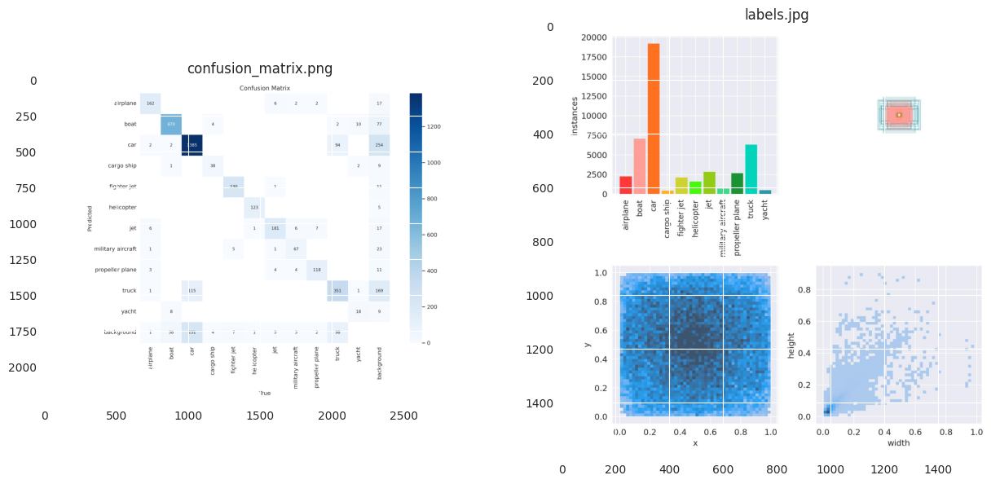

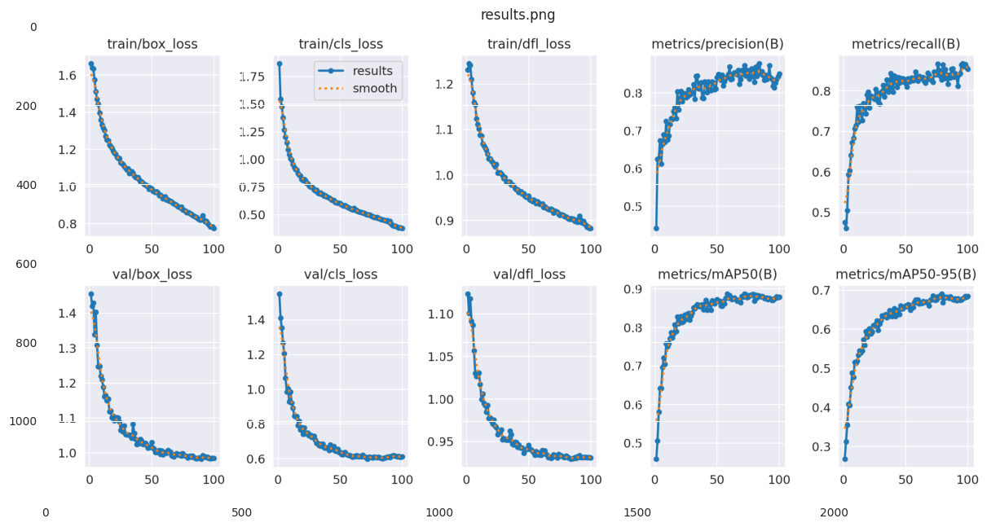

In [9]:
model_path = '/kaggle/working/yolo8/result/'

def plot(ls, size):
    c = 1
    plt.figure(figsize=(15, 10))
    for im in ls:
        plt.subplot(size[0], size[1], c)
        img = plt.imread(model_path + im)
        plt.imshow(img)
        plt.title(im)
        c += 1
    plt.show()

# Visualize images and plots
plot(['val_batch0_pred.jpg', 'val_batch2_pred.jpg'], (1, 2))
plot(['F1_curve.png', 'PR_curve.png'], (1, 2))
plot(['confusion_matrix.png', 'labels.jpg'], (1, 2))
plot(['results.png'], (1, 1))


In [10]:
import pandas as pd

# Read the results.csv file
df = pd.read_csv('/kaggle/working/yolo8/result/results.csv')
df.columns = df.columns.str.strip()

# Extract relevant metrics
precision = df['metrics/precision(B)'].iloc[-1] * 100
recall = df['metrics/recall(B)'].iloc[-1] * 100
mAP50 = df['metrics/mAP50(B)'].iloc[-1] * 100
mAP50_95 = df['metrics/mAP50-95(B)'].iloc[-1] * 100

# Print the metrics
print(f'Precision: {precision:.2f}%')
print(f'Recall: {recall:.2f}%')
print(f'mAP50: {mAP50:.2f}%')
print(f'mAP50-95: {mAP50_95:.2f}%')


Precision: 85.02%
Recall: 85.38%
mAP50: 87.87%
mAP50-95: 68.41%


In [11]:
# Function to perform ship detections
def ship_detect(img_path):
    
    # Read the image
    img = cv2.imread(img_path)

    # Pass the image through the detection model and get the result
    detect_result = model(img)

    # Plot the detections
    detect_img = detect_result[0].plot()
    
    # Convert the image to RGB format
    detect_img = cv2.cvtColor(detect_img, cv2.COLOR_BGR2RGB)
    
    return detect_img


0: 512x512 2 boats, 1 truck, 57.1ms
Speed: 1.3ms preprocess, 57.1ms inference, 1.7ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 7 helicopters, 47.9ms
Speed: 1.7ms preprocess, 47.9ms inference, 1.4ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 11 cars, 2 trucks, 35.8ms
Speed: 1.4ms preprocess, 35.8ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 13 cars, 4 trucks, 35.6ms
Speed: 1.4ms preprocess, 35.6ms inference, 1.4ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 2 cars, 1 truck, 34.8ms
Speed: 1.4ms preprocess, 34.8ms inference, 1.3ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 6 boats, 1 truck, 29.5ms
Speed: 1.5ms preprocess, 29.5ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 4 jets, 2 propeller planes, 3 trucks, 30.1ms
Speed: 1.4ms preprocess, 30.1ms inference, 1.4ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 58 boats, 1 yacht, 31.5ms
Speed:

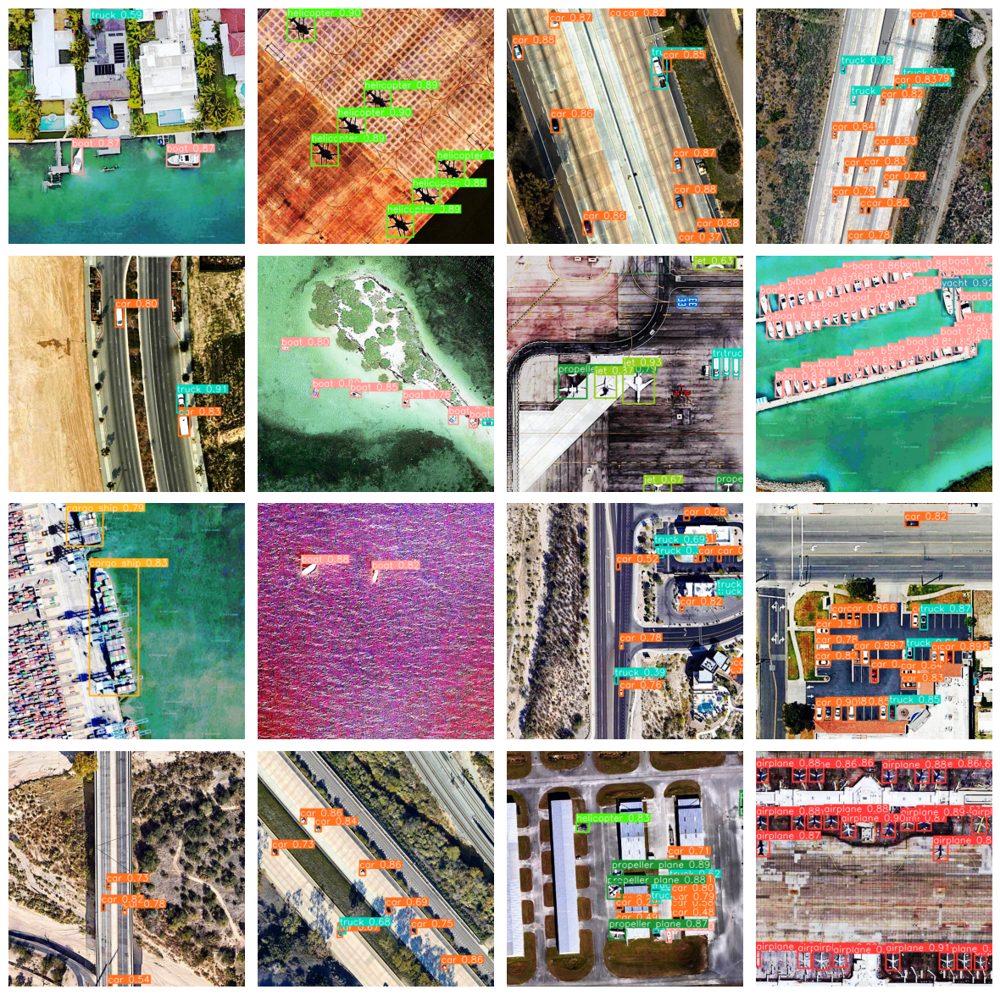

In [12]:
import random

# Define the directory where the custom images are stored
custom_image_dir = '/kaggle/input/sat-augmented/test/images'

# Get the list of image files in the directory
image_files = os.listdir(custom_image_dir)

# Select 16 random images from the list
selected_images = random.sample(image_files, 16)

# Create a figure with subplots for each image
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 15))

# Iterate over the selected images and plot each one
for i, img_file in enumerate(selected_images):
    
    # Compute the row and column index of the current subplot
    row_idx = i // 4
    col_idx = i % 4
    
    # Load the current image and run object detection
    img_path = os.path.join(custom_image_dir, img_file)
    detect_img = ship_detect(img_path)
    
    # Plot the current image on the appropriate subplot
    axes[row_idx, col_idx].imshow(detect_img)
    axes[row_idx, col_idx].axis('off')

# Adjust the spacing between the subplots
plt.subplots_adjust(wspace=0.05, hspace=0.05)